In [ ]:
! pip install kaggle

In [ ]:
!pip install torch torchvision torchaudio

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
  Using cached nvidia_nvjitlink_cu12-12.4.127-py3-none-m

In [1]:
import os
import json
from zipfile import ZipFile
import cv2
import torch

kaggle_credentials = json.load(open("kaggle.json"))
os.environ['KAGGLE_USERNAME'] = kaggle_credentials["username"]
os.environ['KAGGLE_KEY'] = kaggle_credentials["key"]

!kaggle datasets download -d mateohervas/dcsass-dataset

with ZipFile("dcsass-dataset.zip", 'r') as zip_ref:
  zip_ref.extractall()

100% 1.35G/1.35G [01:07<00:00, 24.8MB/s]
100% 1.35G/1.35G [01:07<00:00, 21.6MB/s]


In [2]:
import os
import json
import cv2
import torch
import csv
import numpy as np
from zipfile import ZipFile
import torch.nn as nn
import torchvision.models as models
from torch.utils.data import DataLoader, TensorDataset

**Data Loading and Preprocessing**

In [4]:

def get_video_paths_and_labels(dataset_root, labels_dir):


    behavior_folders = [f for f in os.listdir(dataset_root) if os.path.isdir(os.path.join(dataset_root, f)) and f != "Labels"]

    for behavior in behavior_folders:
        behavior_path = os.path.join(dataset_root, behavior)
        video_subfolders = [f for f in os.listdir(behavior_path) if os.path.isdir(os.path.join(behavior_path, f))]

        csv_filename = behavior + '.csv'
        csv_file_path = os.path.join(labels_dir, csv_filename)
        #print(csv_filename)

        if not os.path.isfile(csv_file_path):
            continue

        with open(csv_file_path, 'r') as csv_file:
            csv_reader = csv.reader(csv_file)

            for video_identifier, label in csv_reader:
                video_subfolder = video_identifier.split("_")[0] + "_" + video_identifier.split("_")[1]
                video_subfolder = video_subfolder + ".mp4"
                video_filename = video_identifier + ".mp4"
                video_path = os.path.join(behavior_path, video_subfolder, video_filename)
                if int(label) == 0:
                  crime = "Normal"
                else :
                  crime = behavior

                if os.path.isfile(video_path):
                    if label.strip():
                        yield video_path, crime
                    else:
                        print(f"Warning: Missing label for video: {video_path}")
                else:
                    print(f"Warning: Video not found: {video_path}")

dataset_root = '/content/DCSASS Dataset'
labels_directory = '/content/Labels'

**Feature Extraction using open cv library**

In [5]:
def preprocess_frames(video_path, max_frames=10):
    frames = []
    cap = cv2.VideoCapture(video_path)
    frame_count = 0

    while True:
        success, frame = cap.read()
        if not success:
            break

        if frame_count % FRAME_EXTRACTION_RATE == 0:
            resized_frame = cv2.resize(frame, TARGET_SIZE)
            rgb_frame = cv2.cvtColor(resized_frame, cv2.COLOR_BGR2RGB)
            normalized_frame = cv2.normalize(rgb_frame, None, alpha=0, beta=1,
                                             norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
            frames.append(normalized_frame)

        frame_count += 1

    cap.release()

    # Pad frames if the number of frames is less than max_frames
    num_frames = len(frames)
    if num_frames < max_frames:
        padding = [np.zeros_like(frames[0]) for _ in range(max_frames - num_frames)]
        frames.extend(padding)
    elif num_frames > max_frames:
        frames = frames[:max_frames]

    # Convert frames list to numpy array
    frames_np = np.array(frames)

    # Transpose the frames to have the channels as the last dimension
    frames_np = frames_np.transpose((0, 3, 1, 2))

    return torch.tensor(frames_np)   # Return as a PyTorch tensor  # Return as a PyTorch tensor

In [6]:

FRAME_EXTRACTION_RATE = 5
TARGET_SIZE = (224, 224)

label_mapping = {
    "Normal": 0,       # Assuming there's a 'Normal' class for non-criminal activities
    "Abuse": 1,
    "Arrest": 2,
    "Arson": 3,
    "Assault": 4,
    "Burglary": 5,
    "Explosion": 6,
    "Fighting": 7,
    "RoadAccidents": 8,
    "Robbery": 9,
    "Shooting": 10,
    "Shoplifting": 11,
    "Stealing": 12,
    "Vandalism": 13
}

**Model Definition**

In [7]:

class CNNLSTM(nn.Module):
    def __init__(self, num_classes=2):
        super(CNNLSTM, self).__init__()

        self.resnet = models.resnet50(pretrained=True)
        self.resnet.fc = nn.Identity()

        self.lstm = nn.LSTM(input_size=2048, hidden_size=512, num_layers=1, batch_first=True)
        self.fc = nn.Linear(512, num_classes)

    def forward(self, x):
        batch_size, timesteps, C, H, W = x.size()
        c_in = x.view(batch_size * timesteps, C, H, W)
        c_out = self.resnet(c_in)
        r_out = c_out.view(batch_size, timesteps, -1)

        h0 = torch.zeros(1, batch_size, 512).to(x.device)
        c0 = torch.zeros(1, batch_size, 512).to(x.device)

        r_out, _ = self.lstm(r_out, (h0, c0))
        r_out = r_out[:, -1, :]
        out = self.fc(r_out)
        return out

In [8]:
# Data Preparation
train_data = []
for video_path, label_str in get_video_paths_and_labels(dataset_root, labels_directory):
    if video_path =='/content/DCSASS Dataset/Shoplifting/Shoplifting001_x264.mp4/Shoplifting001_x264_9.mp4':
      break
    label = label_mapping[label_str]
    frames = preprocess_frames(video_path,max_frames=20)
    train_data.append((frames, label))

# Create DataLoader
features, labels = zip(*train_data)
features = torch.stack(features)
labels = torch.tensor(labels, dtype=torch.long)

dataset = TensorDataset(features, labels)
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)

In [9]:
import torch
import torch.nn as nn


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


model = CNNLSTM().to(device) # Move the model to the GPU
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

def train(model, dataloader, criterion, optimizer, num_epochs=5):
    best_accuracy = 0.0
    best_loss = float('inf')
    patience = 3

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for i, (inputs, labels) in enumerate(dataloader):
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        # Calculate average epoch loss (for printing)
        epoch_loss = running_loss / len(dataloader)

        # Validation Logic
        model.eval()
        with torch.no_grad():
            correct = 0
            total = 0
            val_loss = 0.0

            for inputs, labels in dataloader:
                inputs, labels = inputs.to(device), labels.to(device) # Move data to the GPU
                outputs = model(inputs)

                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

                val_loss += criterion(outputs, labels).item()

            accuracy = 100 * correct / total
            val_loss /= len(dataloader) # Average validation loss

            print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}, Val Loss: {val_loss:.4f}')

            # Early Stopping Logic
            if accuracy >= best_accuracy:
                best_accuracy = accuracy
                torch.save(model.state_dict(), 'best_model.pth')

    print(f'Final Validation Accuracy: {best_accuracy:.2f}%')

# Ensure you have a dataloader defined and pass it to the train function
train(model, dataloader, criterion, optimizer)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/5], Loss: 0.2187, Val Loss: 0.0003
Epoch [2/5], Loss: 0.0002, Val Loss: 0.0001
Epoch [3/5], Loss: 0.0001, Val Loss: 0.0001
Epoch [4/5], Loss: 0.0001, Val Loss: 0.0001
Epoch [5/5], Loss: 0.0000, Val Loss: 0.0000
Final Validation Accuracy: 100.00%


In [31]:
import cv2
import numpy as np
import torch

def preprocess_and_predict(video_path, model, window_size=16, stride=1,shoplifting_class_index=11,max_frames=10):
    # Initialize the video capture
    frames = []
    cap = cv2.VideoCapture(str(video_path))
    frame_count = 0

    while True:
        success, frame = cap.read()
        if not success:
            break

        if frame_count % FRAME_EXTRACTION_RATE == 0:
            resized_frame = cv2.resize(frame, TARGET_SIZE)
            rgb_frame = cv2.cvtColor(resized_frame, cv2.COLOR_BGR2RGB)
            normalized_frame = cv2.normalize(rgb_frame, None, alpha=0, beta=1,
                                             norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
            frames.append(normalized_frame)

        frame_count += 1

    cap.release()

    # Pad frames if the number of frames is less than max_frames
    num_frames = len(frames)
    if num_frames < max_frames:
        padding = [np.zeros_like(frames[0]) for _ in range(max_frames - num_frames)]
        frames.extend(padding)
    elif num_frames > max_frames:
        frames = frames[:max_frames]

    # Convert frames list to numpy array
    frames_np = np.array(frames)

    # Transpose the frames to have the channels as the last dimension
    frames_np = frames_np.transpose((0, 3, 1, 2))

    frames_tensor = torch.tensor(frames_np)  # Stack all frame tensors

    predictions = []
    frame_indices = []
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    model.eval()
    with torch.no_grad():
        for start in range(0, len(frames_tensor) - window_size + 1, stride):
            end = start + window_size
            window = frames_tensor[start:end].unsqueeze(0).to(device)
            output = model(window)
            probabilities = torch.softmax(output, dim=1)
            predicted_class = torch.argmax(probabilities, dim=1)

            if predicted_class.item() == shoplifting_class_index:
                print('shoplifting')  # Check for shoplifting
                return "Shoplifting"


    # If 'shoplifting' was not detected in any frame:
    print('Normal')
    return "Normal"



**Prediction for a Test video from the given data**

In [40]:
preprocess_and_predict('/content/DCSASS Dataset/Shoplifting/Shoplifting054_x264.mp4/Shoplifting054_x264_9.mp4', model)

'Normal'

**Test Data Preparation**

In [ ]:

test_data = []
for video_path, label_str in get_video_paths_and_labels_new(dataset_root, labels_directory):
    label = label_mapping[label_str]
    print(video_path)
    print(label)
    frames = preprocess_frames(video_path,max_frames=10)
    test_data.append((frames, label))

# Create DataLoader
features_new, labels_new = zip(*test_data)
features_1 = torch.stack(features_new)
labels_1 = torch.tensor(labels_new, dtype=torch.long)

dataset_new = TensorDataset(features_1, labels_1)
dataloader_new = DataLoader(dataset_new, batch_size=4, shuffle=True)




Evaluation of the performance of the model using relevant metrics like:
○ Accuracy
○ Precision
○ Recall
○ F1 Score

In [41]:
import cv2
import numpy as np
import torch
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score



def evaluate_model(model, dataloader, shoplifting_class_index=11, normal_class_index=0):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    model.eval()

    true_labels = []
    predicted_labels = []

    with torch.no_grad():
        for video_path, true_label in dataloader:
            result = preprocess_and_predict(video_path, model)

            if result == "Shoplifting":
                true_labels.append(11)  # Assign 1 for shoplifting
                predicted_labels.append(shoplifting_class_index)
            else:
                true_labels.append(0)  # Assign 0 for normal
                predicted_labels.append(normal_class_index)

    accuracy = accuracy_score(true_labels, predicted_labels)
    precision = precision_score(true_labels, predicted_labels)
    recall = recall_score(true_labels, predicted_labels)
    f1 = f1_score(true_labels, predicted_labels)

    print(f'Accuracy: {accuracy:.2f}%')
    print(f'Precision: {precision:.2f}%')
    print(f'Recall: {recall:.2f}%')
    print(f'F1 Score: {f1:.2f}%')





In [ ]:
# Example usage:
evaluate_model(model, dataloader_new)

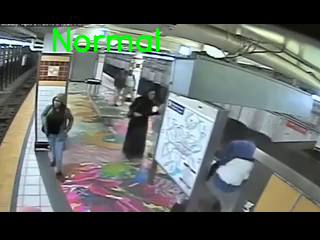

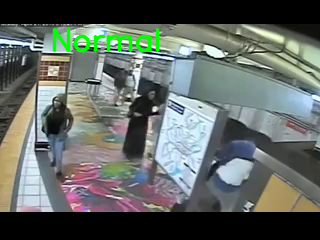

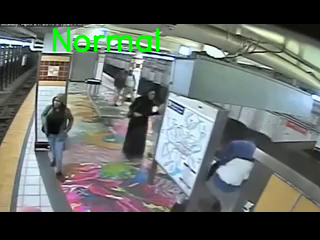

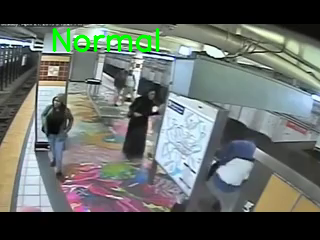

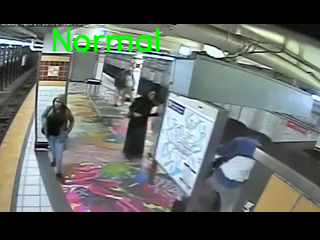

...

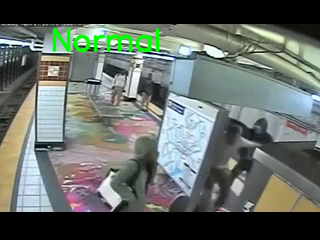

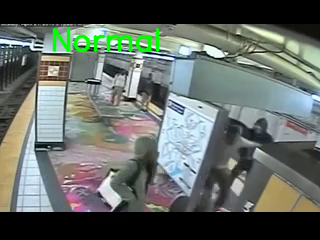

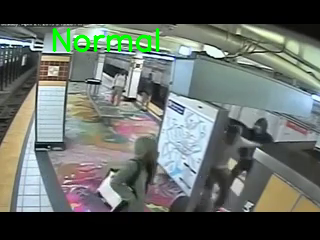

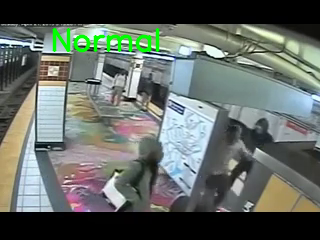

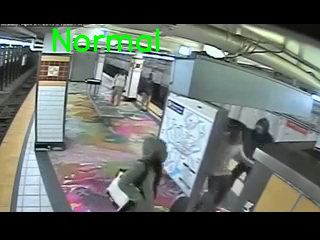

Display complete.


In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import torch

def display_video_with_labels_colab(video_path, predictions, frame_indices, label_mapping):
    cap = cv2.VideoCapture(video_path)
    current_frame = 0
    frame_rate = int(cap.get(cv2.CAP_PROP_FPS))  # Get the original video frame rate

    # Invert the label_mapping to get labels from indices
    index_to_label = {v: k for k, v in label_mapping.items()}

    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break

            # Display prediction on the frame
            predicted = False  # This flag checks if the prediction was shown for the current frame
            for (start, end), prediction in zip(frame_indices, predictions):
                if start <= current_frame < end:
                    label = index_to_label.get(prediction, "Unknown")
                    cv2.putText(frame, label, (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv2.LINE_AA)
                    predicted = True
                    break

            if not predicted:  # Show frames without predictions (if needed)
                cv2.putText(frame, "No Prediction", (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2, cv2.LINE_AA)

            # Show the frame
            cv2_imshow(frame)
            cv2.waitKey(int(1000 / frame_rate))  # Pause for the next frame

            current_frame += 1
    finally:
        cap.release()
        cv2.destroyAllWindows()
        print("Display complete.")

# Usage example (after the model and video path have been defined):
predictions, frame_indices = preprocess_and_predict(video_path, model, window_size=16, stride=1)
display_video_with_labels_colab(video_path, predictions, frame_indices, label_mapping)
